In [2]:
import pandas as pd
import numpy as np
import pytz
import matplotlib.pyplot as plt
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

Read the Stock Data

In [7]:
stock_data = pd.read_csv('../Data/tesla_data.csv')

In [8]:
stock_data['Datetime'] = pd.to_datetime(stock_data['Date'])

Read the Twitter Data

In [9]:
tweets = pd.read_csv('../Data/twitter_data.csv')

In [10]:
tweets['Datetime'] = pd.to_datetime(tweets['date'])

In [ ]:
def convert_to_utc(date):
    local = pytz.timezone ("US/Eastern")
    local_dt = local.localize(date)
    return local_dt.astimezone(pytz.utc)

stock_data['Datetime'] = stock_data['Datetime'].apply(convert_to_utc)   

In [ ]:
stock_data['Net_Gain'] = stock_data['Close']-stock_data['Open']

In [ ]:
def get_day(date):
    return str(date.year) + str(date.month).zfill(2) + str(date.day).zfill(2)
stock_data['Day'] = stock_data['Datetime'].apply(get_day)

# Stock Data 

In [ ]:
stock_data

In [ ]:
stock_day_group = stock_data.groupby('Day')

In [ ]:
tweets['Day'] = tweets['Datetime'].apply(get_day)

In [ ]:
def set_seconds_to_0(datetime):
    return datetime.replace(second=0, microsecond=0)

In [ ]:
tweets['Datetime_0'] = tweets['Datetime'].apply(set_seconds_to_0)

In [ ]:
def group_by_year(date):
    return str(date.year)
tweets['year'] = tweets['Datetime'].apply(group_by_year)

# Twitter Data 

In [ ]:
tweets[['date','retweet','reply', 'retweet_count', 'favorite_count','text','Datetime','Day', 'year']]

In [20]:
tweet_day_group = tweets.groupby('Day')

In [21]:
output_notebook()

Loading BokehJS ...

# Stock Price: 2011-2019

In [22]:
p = figure(title="Test",plot_width=1000, plot_height=400,
          x_axis_label = "Date",y_axis_label = "Stock Price ($)",x_axis_type="datetime")

p.line(stock_data['Datetime'], stock_data['Open'],legend="monthly mean")
show(p)

GlyphRenderer(id='1039', ...)

# <h1>Tweet Metrics

In [23]:
print("Elon Musk has ", len(tweets), " tweets.")

Elon Musk has  8819  tweets.


In [24]:
print(len(tweets[tweets['retweet']==True]), " of those tweets are retweets.")

1134  of those tweets are retweets.


In [25]:
print(len(tweets[tweets['reply']==True]), " of those tweets are replies.")

5482  of those tweets are replies.


In [26]:
years_group = tweets.groupby('year').size()

# <p>Elon Musk has only really started tweeting regularly since 2016

In [27]:
from bokeh.models import ColumnDataSource

years = pd.DataFrame(years_group)
years.rename(columns={0:"tweets"},inplace=True)
years.reset_index(level=0, inplace=True)

src = ColumnDataSource(years)

tooltips = [
    ("Number of tweets", "@tweets")
]

plot = figure(plot_height = 600, 
           plot_width = 600, 
           title = 'Histogram of Tweets per Year',
           x_axis_label = 'Year', 
           y_axis_label = 'Number of Tweets',
           x_range=years['year'],
           tools = "hover, box_zoom",
           tooltips=tooltips)

plot.vbar(x='year', width=0.5, bottom=0, source=src, top='tweets', color="firebrick")
show(plot)

GlyphRenderer(id='1232', ...)

In [28]:
def group_by_week(date):
    return date.week

In [29]:
def graph_means():
    movement_after_tweet = []
    movement_before_tweet = []
    times = []
    for date, info in stock_day_group:
        roll_mean = info.iloc[:,6].rolling(window=30).mean()

        try:
            tweet = tweet_day_group.get_group(date)
            stock_begin = info['Datetime'].iloc[-1]
            stock_end = info['Datetime'].iloc[0]
            tweets_during_stock_open = tweet[(tweet['Datetime_0'] >= stock_begin) & (tweet['Datetime_0'] <= stock_end)]
            for index, row in tweets_during_stock_open.iterrows():
                ind = info[info['Datetime'] == row[9]].index[0]
                after = roll_mean[ind]
                before = roll_mean[ind+30]
                if pd.isna(after) or pd.isna(before): 
                    continue
                movement_after_tweet.append(abs(after))
                movement_before_tweet.append(abs(before))
                times.append(row[9])
        except:
            pass
    df = pd.DataFrame(list(zip(times, movement_before_tweet, movement_after_tweet)), 
               columns =['date', 'before', 'after']) 
    df['week'] = df['date'].apply(group_by_week)
    df['year'] = df['date'].apply(group_by_year)
    return df

In [30]:
result_df = graph_means()

# The points within the red boxes are of particular importance. They indicate tweets in which the averge movement of the price of the stock changes drasticly after the tweet.

In [31]:
p = figure(title="Scatter of Tweets",plot_width=600, plot_height=600,
          x_axis_label = "30 minutes before tweet ($)",y_axis_label = "30 minutes after tweet ($)", x_range=(0,.1), y_range=(0,.15))
p.circle(result_df['before'], result_df['after'],size=1)
p.line([0,.02,.02,0],[.14,.14,.021,.021],color="red")
p.line([.021,.021,.1,.1],[0,.02,.02,0],color="red")

show(p)

GlyphRenderer(id='1349', ...)

GlyphRenderer(id='1356', ...)

GlyphRenderer(id='1363', ...)

In [32]:
from bokeh.transform import dodge

In [33]:
def graph_weeks_of_year(year):
    week_group = result_df[result_df['year']==year].groupby('week')
    differences = []
    weeks = []
    for index_week, info_week in week_group:
        differences.append(abs(info_week['after']-info_week['before']).mean())
        weeks.append(str(info_week['week'].iloc[0])) 
    df = pd.DataFrame(list(zip(weeks, differences)), columns =['week', 'difference']) 

    
    src = ColumnDataSource(df)
    tooltips = [
        ("Change ($)", "@difference")
    ]
    title = year + ': Difference in before/after of tweets per week'
    plot = figure(plot_height = 500, 
                plot_width = 1000, 
                title = title,
                x_axis_label = 'Week', 
                y_axis_label = 'Change ($)',
                x_range=weeks,
                tools = "hover, box_zoom",
                tooltips=tooltips
            )

    plot.vbar(x='week', width=0.5, source=src, top='difference')
    show(plot)

# The following graphs indicate the effect of Elon Musk's Tweets on the stock price. The x-axis represents the tweets during each week of the year. The Y-axis indicates the change in the average movement of the stock (per minute) from the 30 minutes before it was tweeted compared to the 30 minutes after the tweet was tweeted.

In [34]:
graph_weeks_of_year('2012')

## For example, look at week 21 of the graph above, with a value of .014. This indicated that the absolute value of: (the moving averge during the 30 minutes before the tweet minus the moving average during the 30 minutes after the tweet) was ~ $0.014. Remember that this is on a per-minute basis and is therefore signifigant. 

In [35]:
graph_weeks_of_year('2013')

In [36]:
graph_weeks_of_year('2014')

In [37]:
graph_weeks_of_year('2015')

In [38]:
graph_weeks_of_year('2016')

In [39]:
graph_weeks_of_year('2017')

In [40]:
graph_weeks_of_year('2018')

In [41]:
graph_weeks_of_year('2019')

In [42]:
def graph_means_grouped(filter_):
    movement_after_tweet = []
    movement_before_tweet = []
    day_difference = []
    times = []
    for date, info in stock_day_group:
        roll_mean = info.iloc[:,6].rolling(window=30).mean()

        try:
            tweet = tweet_day_group.get_group(date)
            stock_begin = info['Datetime'].iloc[-1]
            stock_end = info['Datetime'].iloc[0]
            tweets_stock_open = tweet[(tweet['Datetime_0'] >= stock_begin) & (tweet['Datetime_0'] <= stock_end)]
            
            if filter_ == 'post':
                tweets_during_stock_open = tweets_stock_open[(tweets_stock_open['retweet'] == False) & (tweets_stock_open['reply'] == False)]
            if filter_ == 'reply':
                tweets_during_stock_open = tweets_stock_open[(tweets_stock_open['retweet'] == False) & (tweets_stock_open['reply'] == True)]
            if filter_ == 'retweet':
                tweets_during_stock_open = tweets_stock_open[(tweets_stock_open['retweet'] == True) & (tweets_stock_open['reply'] == False)]
            
            for index, row in tweets_during_stock_open.iterrows():
                ind = info[info['Datetime'] == row[9]].index[0]
                after = roll_mean[ind]
                before = roll_mean[ind+30]
                if pd.isna(after) or pd.isna(before): 
                    continue
                movement_after_tweet.append(abs(after))
                movement_before_tweet.append(abs(before))
                times.append(row[9])
        except:
            pass
    df = pd.DataFrame(list(zip(times, movement_before_tweet, movement_after_tweet)), 
               columns =['date', 'before', 'after']) 
    df['week'] = df['date'].apply(group_by_week)
    df['year'] = df['date'].apply(group_by_year)
    return df

In [43]:
def graph_weeks_of_year_grouped(year, post_df, retweet_df, reply_df):
    
    week_group_post = post_df[post_df['year']==year].groupby('week')
    week_group_retweet = retweet_df[retweet_df['year']==year].groupby('week')
    week_group_reply = reply_df[reply_df['year']==year].groupby('week')

    differences_post = []
    differences_retweet = []
    differences_reply = []
    weeks_post = []
    weeks_retweet = []
    weeks_reply = []
    
    weeks = list(range(1,53))
    weeks = [str(week) for week in weeks]
    
    for index_week, info_week in week_group_post:
        differences_post.append(abs(info_week['after']-info_week['before']).mean())
        weeks_post.append(str(info_week['week'].iloc[0]))
    for index_week, info_week in week_group_retweet:
        differences_retweet.append(abs(info_week['after']-info_week['before']).mean())
        weeks_retweet.append(str(info_week['week'].iloc[0]))
    for index_week, info_week in week_group_reply:
        differences_reply.append(abs(info_week['after']-info_week['before']).mean())
        weeks_reply.append(str(info_week['week'].iloc[0]))
        
    df_post = pd.DataFrame(list(zip(weeks_post, differences_post)), columns =['week', 'difference'])
    df_retweet = pd.DataFrame(list(zip(weeks_retweet, differences_retweet)), columns =['week', 'difference']) 
    df_reply = pd.DataFrame(list(zip(weeks_reply, differences_reply)), columns =['week', 'difference']) 

    
    src_post = ColumnDataSource(df_post)
    src_retweet = ColumnDataSource(df_retweet)
    src_reply = ColumnDataSource(df_reply)
    tooltips = [
        ("Change ($)", "@difference")
    ]
    title = year + ': Difference in before/after of tweets per week'
    plot = figure(plot_height = 500, 
                plot_width = 1500, 
                title = title,
                x_axis_label = 'Week', 
                y_axis_label = 'Change ($)',
                x_range=weeks,
                tools = "hover, box_zoom",
                tooltips=tooltips
            )

    plot.vbar(x=dodge('week',  -0.25,range=plot.x_range), width=0.25, source=src_post, color="blue", top='difference',legend="Original Post")
    plot.vbar(x=dodge('week',  0.0,range=plot.x_range), width=0.25, source=src_retweet, color="orange", top='difference',legend="Retweet")
    plot.vbar(x=dodge('week',  0.25,range=plot.x_range), width=0.25, source=src_reply, color="green", top='difference',legend="Reply")
    plot.legend.location = "top_left"

    show(plot)

In [44]:
graph_data_post = graph_means_grouped('post')
graph_data_retweet = graph_means_grouped('retweet')
graph_data_reply = graph_means_grouped('reply')

# The following graphs show the difference between Elon's Musks personal posts, retweets of other tweets, and replies to other tweets. When observing the graphs from 2016-2019, it is obvious that his personal posts have the largest affect on the stock price. The y-axis represents exaclty what it did in the previous set of graphs.

In [45]:
graph_weeks_of_year_grouped('2019',graph_data_post, graph_data_retweet, graph_data_reply)

In [46]:
graph_weeks_of_year_grouped('2018',graph_data_post, graph_data_retweet, graph_data_reply)

In [47]:
graph_weeks_of_year_grouped('2017',graph_data_post, graph_data_retweet, graph_data_reply)

In [48]:
graph_weeks_of_year_grouped('2016',graph_data_post, graph_data_retweet, graph_data_reply)

In [49]:
graph_weeks_of_year_grouped('2015',graph_data_post, graph_data_retweet, graph_data_reply)

In [50]:
def get_favorite_retweet_count(retweet_count_threshold=0, favorite_count_thresdhold=0):
    movement_after_tweet = []
    movement_before_tweet = []
    times = []
    for date, info in stock_day_group:
        roll_mean = info.iloc[:,6].rolling(window=30).mean()

        try:
            tweet = tweet_day_group.get_group(date)
            stock_begin = info['Datetime'].iloc[-1]
            stock_end = info['Datetime'].iloc[0]
            tweets_during_stock_open = tweet[(tweet['Datetime_0'] >= stock_begin) & 
                                             (tweet['Datetime_0'] <= stock_end) & 
                                             (tweet['retweet_count'] >= retweet_count_threshold) & 
                                             (tweet['favorite_count'] >= favorite_count_thresdhold)]
            for index, row in tweets_during_stock_open.iterrows():
                ind = info[info['Datetime'] == row[9]].index[0]
                after = roll_mean[ind]
                before = roll_mean[ind+30]
                if pd.isna(after) or pd.isna(before): 
                    continue
                movement_after_tweet.append(abs(after))
                movement_before_tweet.append(abs(before))
                times.append(row[9])
        except:
            pass
    df = pd.DataFrame(list(zip(times, movement_before_tweet, movement_after_tweet)), 
               columns =['date', 'before', 'after']) 
    df['week'] = df['date'].apply(group_by_week)
    df['year'] = df['date'].apply(group_by_year)
    return df

In [51]:
def graph_and_compare_retweets_favorites(year,retweet_df, difference_threshold=0):
    
    week_group = result_df[result_df['year']==year].groupby('week')
    week_group_retweet = retweet_df[retweet_df['year']==year].groupby('week')

    differences = []
    differences_retweet = []

    weeks = []
    weeks_retweet = []
    
    for index_week, info_week in week_group:
        i = abs(info_week['after']-info_week['before']).mean()
        if i >= difference_threshold:
            differences.append(abs(info_week['after']-info_week['before']).mean())
            weeks.append(str(info_week['week'].iloc[0]))
    for index_week, info_week in week_group_retweet:
        differences_retweet.append(abs(info_week['after']-info_week['before']).mean())
        weeks_retweet.append(str(info_week['week'].iloc[0]))

    df = pd.DataFrame(list(zip(weeks, differences)), columns =['week', 'difference'])
    df_retweet = pd.DataFrame(list(zip(weeks_retweet, differences_retweet)), columns = ['week', 'difference']) 

    
    src = ColumnDataSource(df)
    src_retweet = ColumnDataSource(df_retweet)

    tooltips = [
        ("Change ($)", "@difference")
    ]
    title = year + ': Difference in before/after of tweets per week'
    plot = figure(plot_height = 500, 
                plot_width = 1500, 
                title = title,
                x_axis_label = 'Week', 
                y_axis_label = 'Change ($)',
                x_range=weeks,
                tools = "hover, box_zoom",
                tooltips=tooltips
            )

    plot.vbar(x=dodge('week',  -0.2,range=plot.x_range), width=0.25, source=src, color="orange", top='difference',legend="No Threshold")
    plot.vbar(x=dodge('week',  0.2,range=plot.x_range), width=0.25, source=src_retweet, color="purple", top='difference',legend="Threshold")
    plot.legend.location = "top_left"

    show(plot)

# It is interesting to see if filtering out posts with less than certain retweet-counts / favorite_counts has an affect on the impact of a tweet  

In [52]:
test_1 = get_favorite_retweet_count(50,500)

In [53]:
graph_and_compare_retweets_favorites('2018',test_1)

In [54]:
test_2 = get_favorite_retweet_count(20,1000)
graph_and_compare_retweets_favorites('2018',test_2)

In [55]:
test_3 = get_favorite_retweet_count(30,300)
graph_and_compare_retweets_favorites('2019',test_3)

In [56]:
import ipywidgets as widgets
retweet_threshold = widgets.IntSlider(
    value=0,
    min=0,
    max=5000,
    step=1,
    description='Retweets:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d'
)
favorite_threshold = widgets.IntSlider(
    value=0,
    min=0,
    max=5000,
    step=1,
    description='Favorites:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d'
)
year_threshold = widgets.IntSlider(
    value=2012,
    min=2012,
    max=2019,
    step=1,
    description='Year:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d'
)

# Interactive Graph

In [57]:
display(retweet_threshold)
display(favorite_threshold)
display(year_threshold)

IntSlider(value=0, continuous_update=False, description='Retweets:', max=5000)

IntSlider(value=0, continuous_update=False, description='Favorites:', max=5000)

IntSlider(value=2012, continuous_update=False, description='Year:', max=2019, min=2012)

In [58]:
df_4 = get_favorite_retweet_count(retweet_threshold.value, favorite_threshold.value)
graph_and_compare_retweets_favorites(str(year_threshold.value),df_4)

# In order to check some of our data, it is helpful to investigate some of the tweets that caused the biggest shifts in the stock price.

In [60]:
from IPython.display import display, Image, SVG

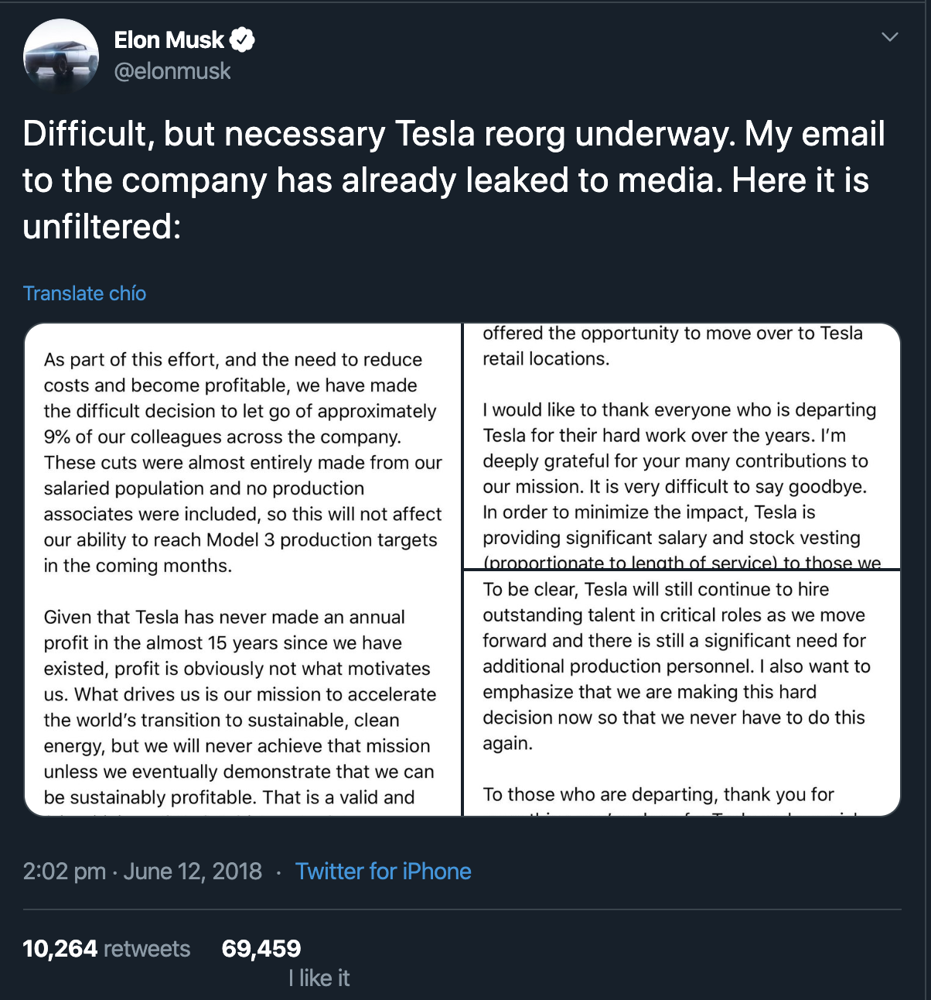

In [61]:
Image(filename='./1.png')

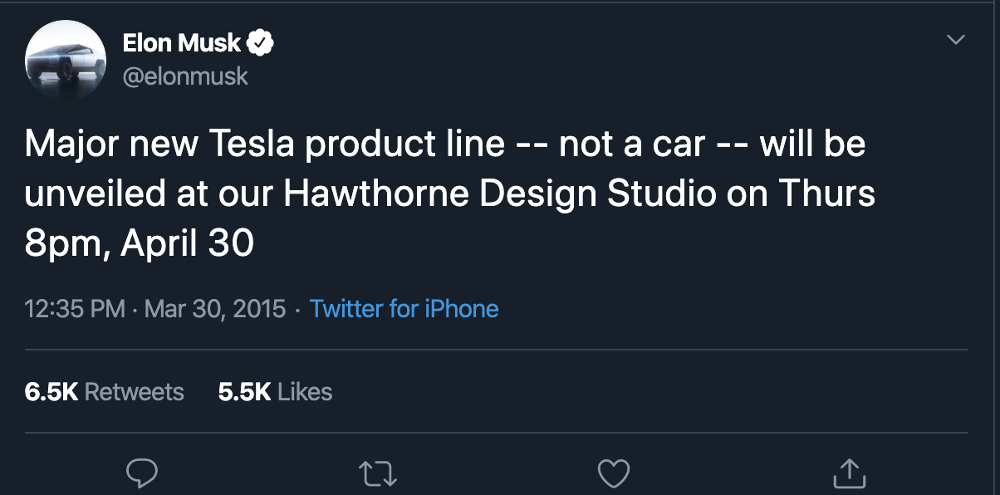

In [62]:
Image(filename='./3.png')

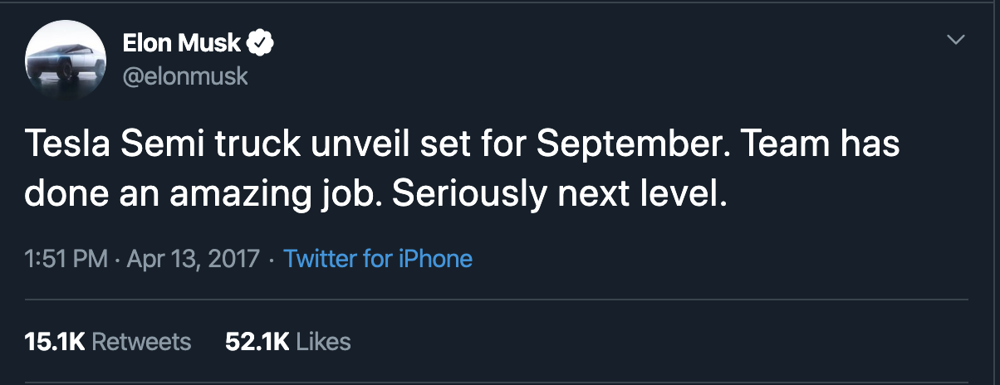

In [63]:
Image(filename='./4.png')